<a href="https://colab.research.google.com/github/KatHaruto/PINNs_example/blob/main/pinns_example.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [10]:
import torch
import torch.nn as nn
from scipy.stats import qmc
from torch.optim.lr_scheduler import CosineAnnealingLR
# ----------------------------------------------
# 1) ネットワーク定義
# ----------------------------------------------
class OzoneVelocityNet(nn.Module):
    def __init__(self, n_hidden=256, n_layers=4):
        super().__init__()
        self.input_dim = 4
        self.output_dim = 4  # c,u,v,w
        layers = []
        layers.append(nn.Linear(self.input_dim, n_hidden))
        layers.append(nn.Tanh())
        for _ in range(n_layers - 1):
            layers.append(nn.Linear(n_hidden, n_hidden))
            layers.append(nn.Tanh())
        layers.append(nn.Linear(n_hidden, self.output_dim))
        self.model = nn.Sequential(*layers)

    def forward(self, X):
        # X: (N,4)
        return self.model(X)

# ---------------------
# PDE残差
# (先ほど示した修正版)
# ---------------------
def pde_residual(model, X, D, source_fn, remove_fn,epoch):
    #X.requires_grad_(True)  # ここで付け直す or 事前に付けておいてもOK
    out = model(X)
    c = out[:,0:1]
    u = out[:,1:2]
    v = out[:,2:3]
    w = out[:,3:4]

    grad_c = torch.autograd.grad(c, X, torch.ones_like(c), create_graph=True)[0]
    dc_dx = grad_c[:,0:1]
    dc_dy = grad_c[:,1:2]
    dc_dz = grad_c[:,2:3]
    dc_dt = grad_c[:,3:4]

    # 2次微分
    d2c_dx2 = torch.autograd.grad(dc_dx, X, torch.ones_like(dc_dx), create_graph=True)[0][:,0:1]
    d2c_dy2 = torch.autograd.grad(dc_dy, X, torch.ones_like(dc_dy), create_graph=True)[0][:,1:2]
    d2c_dz2 = torch.autograd.grad(dc_dz, X, torch.ones_like(dc_dz), create_graph=True)[0][:,2:3]

    grad_u = torch.autograd.grad(u, X, torch.ones_like(u), create_graph=True)[0]
    grad_v = torch.autograd.grad(v, X, torch.ones_like(v), create_graph=True)[0]
    grad_w = torch.autograd.grad(w, X, torch.ones_like(w), create_graph=True)[0]

    du_dx = grad_u[:,0:1]
    dv_dy = grad_v[:,1:2]
    dw_dz = grad_w[:,2:3]

    # 移流 + 拡散
    adv = u*dc_dx + v*dc_dy + w*dc_dz
    diff = D*(d2c_dx2 + d2c_dy2 + d2c_dz2)

    x = X[:,0:1]
    y = X[:,1:2]
    z = X[:,2:3]
    t_ = X[:,3:4]
    S_val = source_fn(x,y,z,t_)
    R_val = remove_fn(x,y,z,c)

    # cのPDE残差
    res_c = dc_dt + adv - diff+ R_val - S_val
    if epoch % 1000 == 0:
      print(f"dc_dt: {dc_dt.detach().mean().item():.2e}, adv: {adv.detach().mean().item():.2e}, diff: {diff.detach().mean().item():.2e}, R_val: {R_val.detach().mean().item():.2e}, S_val: {S_val.detach().mean().item():.2e}")
    # div(u)=0 の残差
    res_div = du_dx + dv_dy + dw_dz

    return res_c, res_div
# ----------------------------------------------
# 3) 初期条件・境界条件の損失例
# ----------------------------------------------
def initial_condition_loss(model, x, y, z, t0, c0, u0, v0, w0):
    """
    t=0における c, u, v, w の初期値損失 (Dirichlet型)
    """
    inputs = torch.stack((x, y, z, t0), dim=1)
    out = model(inputs)
    c_pred = out[:, 0:1]
    u_pred = out[:, 1:2]
    v_pred = out[:, 2:3]
    w_pred = out[:, 3:4]

    loss_c = torch.mean((c_pred - c0)**2)
    loss_u = torch.mean((u_pred - u0)**2)
    loss_v = torch.mean((v_pred - v0)**2)
    loss_w = torch.mean((w_pred - w0)**2)

    return loss_c + loss_u + loss_v + loss_w

def boundary_condition_loss(model, x, y, z, t, c_bc, u_bc, v_bc, w_bc):
    """
    境界条件(Dirichlet)として c, u, v, w の値が与えられているケース
    例: 壁面速度を 0、壁面濃度を 0 などとする
    """
    inputs = torch.stack((x, y, z, t), dim=1)
    out = model(inputs)
    c_pred = out[:, 0:1]
    u_pred = out[:, 1:2]
    v_pred = out[:, 2:3]
    w_pred = out[:, 3:4]

    loss_c = torch.mean((c_pred - c_bc)**2)
    loss_u = torch.mean((u_pred - u_bc)**2)
    loss_v = torch.mean((v_pred - v_bc)**2)
    loss_w = torch.mean((w_pred - w_bc)**2)

    return loss_c + loss_u + loss_v + loss_w

def boundary_condition_loss_neumann_plane_x0(model, x, y, z, t, c_bc, u_bc, v_bc, w_bc):
    """
    x=0 の面に ∂c/∂x = flux_bc を与えるノイマン条件
    X_bc: (N_bc, 4) = (x, y, z, t),  ただし x=0
    flux_bc: (N_bc,1),  指定したい値 (例:0)
    """
    inputs = torch.stack((x, y, z, t), dim=1)
    inputs = inputs.clone().detach().requires_grad_(True)
    out = model(inputs)
    c_pred = out[:, 0:1]
    u_pred = out[:, 1:2]
    v_pred = out[:, 2:3]
    w_pred = out[:, 3:4]

    grad_c = torch.autograd.grad(
        c_pred, inputs,
        grad_outputs=torch.ones_like(c_pred),
        create_graph=True
    )[0]  # (N_bc,4)

    dc_dx = grad_c[:, 0:1]  # xに関する微分
    dc_dy = grad_c[:, 1:2]
    dc_dz = grad_c[:, 2:3]



    alpha = 0.1
    flux_bc = -alpha * torch.ones_like(inputs)

    loss_neumann = torch.mean((grad_c - flux_bc)**2)
    return loss_neumann


# ----------------------------------------------
# 5) 実行例 (パラメータとダミーデータ)
# ----------------------------------------------
if __name__ == "__main__":

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    sobol = qmc.Sobol(d=4,scramble=True)
    # データ作成
    N_pde = 4096
    X_pde = torch.from_numpy(sobol.random(N_pde)).float().to(device)
    X_pde[:,0] = X_pde[:,0] * 2
    X_pde[:,1] = X_pde[:,1] * 2
    X_pde[:,2] = X_pde[:,2] * 2


    # x_p = torch.from_numpy(sobol.random(N_pde)).float().to(device)*2 - 1
    # y_p = torch.from_numpy(sobol.random(N_pde)).float().to(device)*2 - 1
    # z_p = torch.from_numpy(sobol.random(N_pde)).float().to(device)*2.0
    # t_p = torch.from_numpy(sobol.random(N_pde)).float().to(device)*1.0
    # X_pde = torch.cat([x_p,y_p,z_p,t_p], dim=1)


    N_ic = 1024
    x_ic = torch.rand(N_ic, device=device)*2
    y_ic = torch.rand(N_ic, device=device)*2
    z_ic = torch.rand(N_ic, device=device)*2
    t_ic = torch.zeros(N_ic, device=device)*1.0
    c_ic = torch.zeros(N_ic, 1, device=device)
    u_ic = torch.zeros(N_ic, 1, device=device)
    v_ic = torch.zeros(N_ic, 1, device=device)
    w_ic = torch.zeros(N_ic, 1, device=device)


    N_bc = 1024
    import numpy as np
    #theta = 2*np.pi*torch.rand(N_bc, device=device)
    #phi = np.pi*torch.rand(N_bc, device=device)
    #r = 1.0
    x_bc = (torch.rand(N_bc, device=device) > 0.5)*2  # r * torch.sin(phi) * torch.cos(theta)
    y_bc = (torch.rand(N_bc, device=device) > 0.5)*2   # r * torch.sin(phi) * torch.sin(theta)
    z_bc = (torch.rand(N_bc, device=device) > 0.5)*2  # r * torch.cos(phi)
    t_bc = torch.rand(N_bc, device=device)*1.0

    c_bc = torch.zeros(N_bc, 1, device=device)
    u_bc = torch.zeros(N_bc, 1, device=device)
    v_bc = torch.zeros(N_bc, 1, device=device)
    w_bc = torch.zeros(N_bc, 1, device=device)
    # "X_pde.requires_grad_(True)" は trainループ内でも可

    def score_bc_weight(X):
      return 1 - X[:,3]
    # ソースとリムーブ例
    D_val = 1
    def source_fn(x,y,z,t):
        return 1e-1 * torch.exp(-2*((x-1)**2+(y-1)**2+z**2))
    k_val = 1e-1
    def remove_fn(x,y,z,c):
        return k_val*c

    def closure():
      optmizer.zero_grad()
      lbfgs_opt.zero_grad()
      X_pde_ = X_pde.clone().detach().requires_grad_(True)

      res_c, res_div = pde_residual(model, X_pde_, D_val, source_fn, remove_fn, epoch)
      loss_pde_c = torch.mean(res_c**2)
      loss_div   = torch.mean(res_div**2)

      loss_ic = initial_condition_loss(model,
                                        x_ic, y_ic, z_ic, t_ic,
                                        c_ic, u_ic, v_ic, w_ic)

      # --- 境界条件の損失 ---
      loss_bc = boundary_condition_loss(model,
                                        x_bc, y_bc, z_bc, t_bc,
                                        c_bc, u_bc, v_bc, w_bc)

      #ic_weight = 0.5
      #bc_weight = 0.5

        # --- 総合損失 ---
      # loss = ( 1 - ic_weight + 1 - bc_weight) / 2 * (loss_pde_c + loss_div) + ic_weight * loss_ic + bc_weight * loss_bc
      loss =  loss_pde_c + loss_div + loss_ic + loss_bc
      loss.backward()

      if epoch % 1000 == 0:
        print(f"Epoch {epoch} | PDE_c: {loss_pde_c.item():.2e}, Div: {loss_div.item():.2e}, IC: {loss_ic.item():.2e}, BC: {loss_bc.item():.2e}")

      return loss

    model = OzoneVelocityNet().to(device)
    optmizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    lbfgs_opt = torch.optim.LBFGS(model.parameters(), lr=1e-4, max_iter=1000)
    #scheduler = CosineAnnealingLR(optimizer, T_max=20000)

    for epoch in range(6001):
        closure()
        optmizer.step()
    lbfgs_opt.step(closure)


dc_dt: -4.68e-02, adv: 3.59e-03, diff: -1.91e-03, R_val: 6.48e-03, S_val: 1.12e-02
Epoch 0 | PDE_c: 3.34e-03, Div: 1.39e-03, IC: 2.25e-02, BC: 1.83e-02
dc_dt: 2.79e-03, adv: -1.83e-07, diff: -8.26e-03, R_val: 2.08e-04, S_val: 1.12e-02
Epoch 1000 | PDE_c: 2.75e-05, Div: 4.84e-07, IC: 4.46e-06, BC: 1.79e-06
dc_dt: 3.16e-03, adv: -2.13e-06, diff: -7.82e-03, R_val: 2.35e-04, S_val: 1.12e-02
Epoch 2000 | PDE_c: 1.43e-05, Div: 1.86e-07, IC: 1.97e-06, BC: 7.54e-07
dc_dt: 3.40e-03, adv: -7.18e-06, diff: -7.59e-03, R_val: 2.57e-04, S_val: 1.12e-02
Epoch 3000 | PDE_c: 1.06e-05, Div: 2.10e-06, IC: 3.72e-06, BC: 2.54e-06
dc_dt: 3.53e-03, adv: 3.39e-06, diff: -7.50e-03, R_val: 2.69e-04, S_val: 1.12e-02
Epoch 4000 | PDE_c: 8.86e-06, Div: 3.22e-06, IC: 3.79e-06, BC: 2.90e-06
dc_dt: 3.60e-03, adv: -1.19e-06, diff: -7.30e-03, R_val: 2.45e-04, S_val: 1.12e-02
Epoch 5000 | PDE_c: 7.68e-06, Div: 4.89e-08, IC: 1.13e-06, BC: 2.92e-07
dc_dt: 3.52e-03, adv: -1.50e-06, diff: -6.46e-03, R_val: 6.61e-05, S_val: 

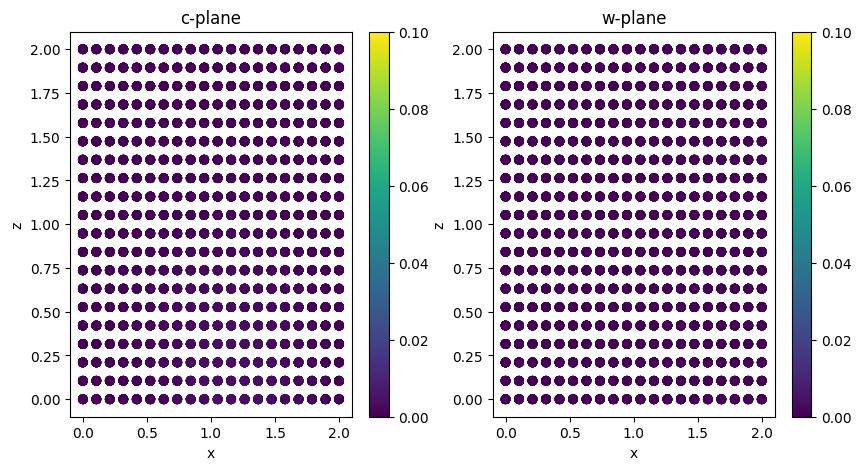

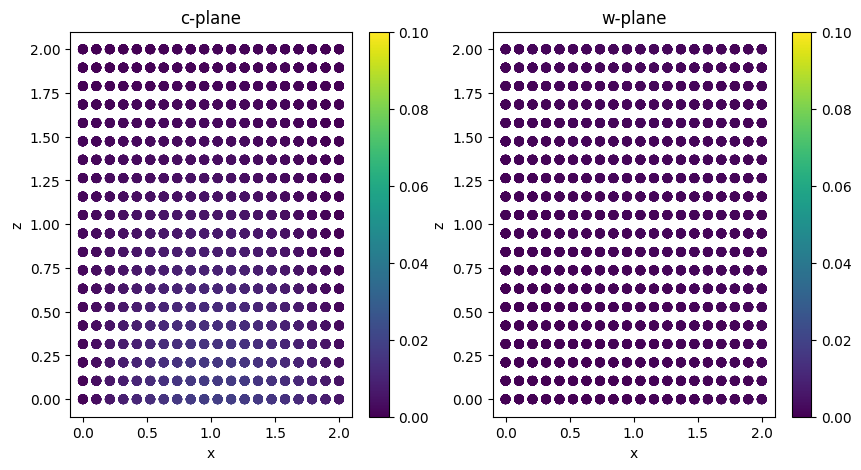

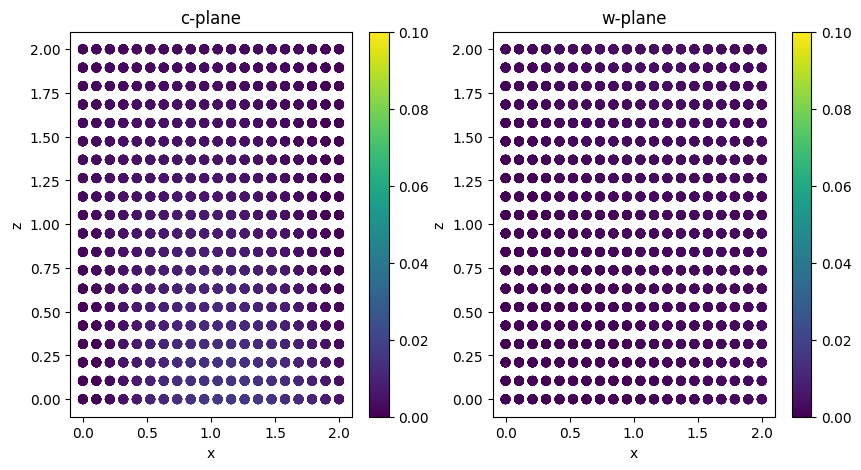

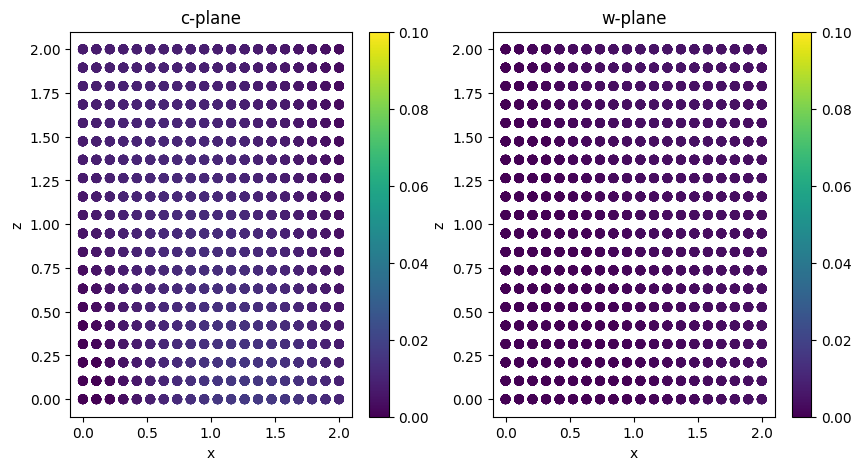

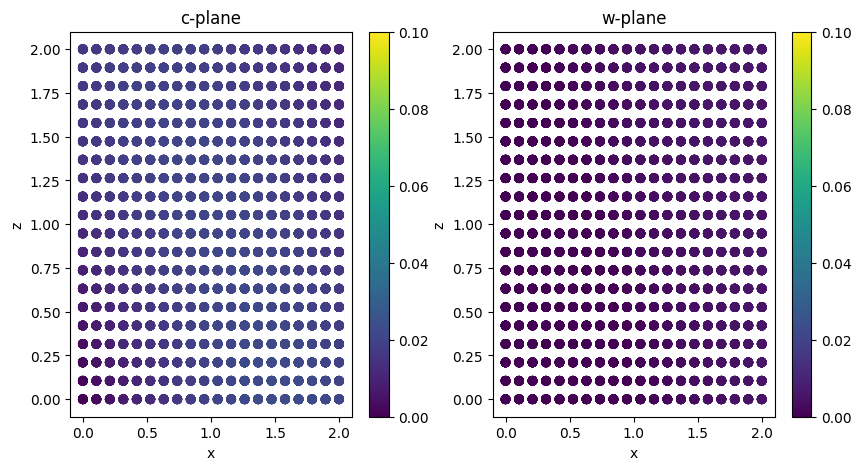

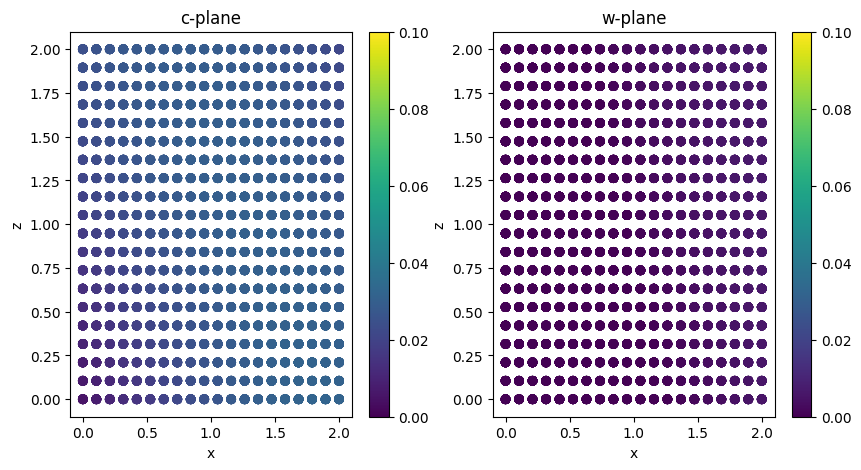

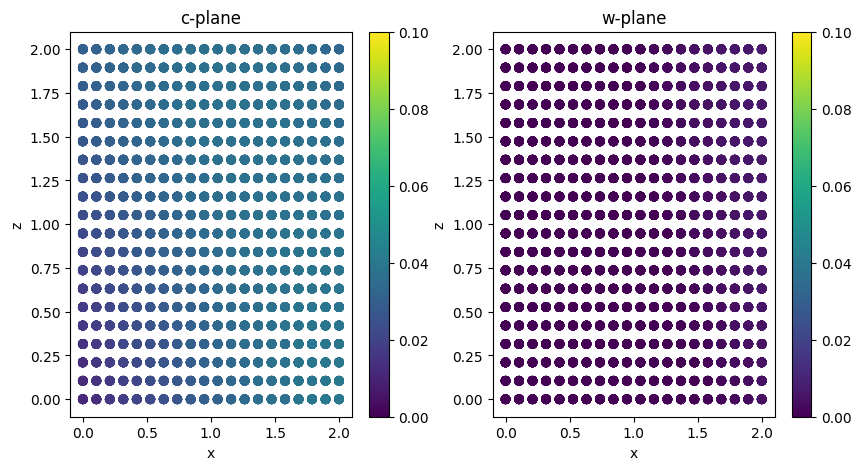

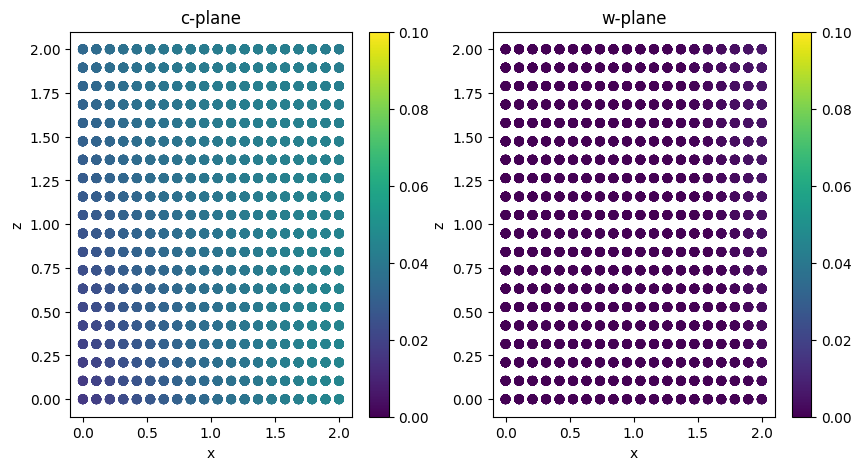

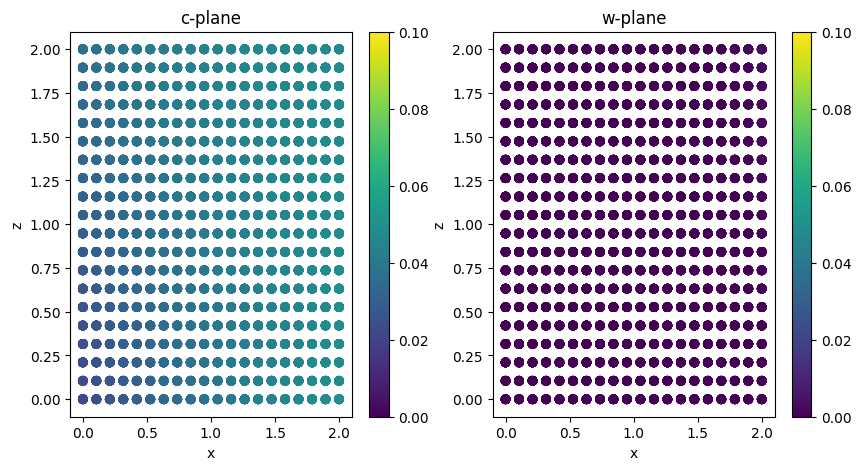

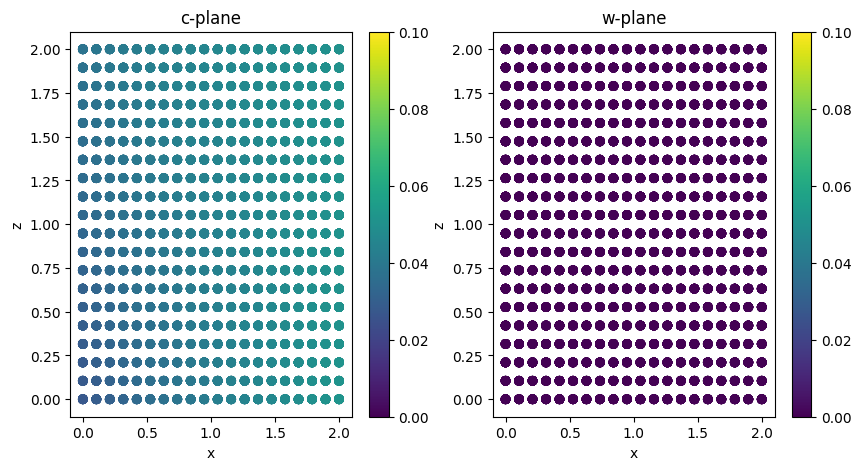

In [34]:
import matplotlib
cm = matplotlib.colormaps.get_cmap('viridis')

for t in range(10):
  t_star = np.zeros((8000, 1))
  t_star.fill(t )
  t_star = torch.from_numpy(t_star)

  x_star = torch.linspace(0., 2.0, 20) #np.linspace(0, 1.1, 201)
  y_star = torch.ones(20,1)
  z_star = torch.linspace(0., 2.0, 20)

  x_star, y_star,z_star  = np.meshgrid(x_star, y_star,z_star)
  x_star = x_star.flatten()[:, None]
  y_star = y_star.flatten()[:, None]
  z_star = z_star.flatten()[:, None]
  x_star = torch.from_numpy(x_star.flatten()[:, None])
  y_star = torch.from_numpy(y_star.flatten()[:, None])
  z_star = torch.from_numpy(z_star.flatten()[:, None])

  model_input = torch.cat([x_star, y_star,z_star, t_star], dim=1).float().to("cuda:0")
  out = model(model_input)
  out =out.to("cpu")
  c_pred = out[:, 0:1]
  u_pred = out[:, 1:2]
  v_pred = out[:, 2:3]
  w_pred = out[:, 3:4]

  # plot x-z plane

  fig = plt.figure(figsize=(10, 5))
  ax = fig.add_subplot(1, 2, 1)
  sc= ax.scatter(x_star.detach().numpy(), z_star.detach().numpy(),c= c_pred.detach().numpy(),cmap=cm,vmin=0, vmax=0.1)
  fig.colorbar(sc)
  ax.set_xlabel('x')
  ax.set_ylabel('z')
  ax.set_title('c-plane')

  ax = fig.add_subplot(1, 2, 2)
  sc = ax.scatter(x_star.detach().numpy(), z_star.detach().numpy(),c= w_pred.detach().numpy(),cmap=cm,vmin=0, vmax=0.1)
  ax.set_xlabel('x')
  ax.set_ylabel('z')
  ax.set_title('w-plane')
  fig.colorbar(sc)
  plt.show()


In [21]:
import numpy as np
import plotly.graph_objects as go
import matplotlib.pyplot as plt

frame = []
fig = go.Figure(
    data=[go.Scatter3d(x=[], y=[], z=[],
                     mode="markers",marker=dict(color="red", size=10))])

def plot_3d(data,fig_name):
  index = data[:,3] >= 0

  _fig = go.Frame(
    data=[
          go.Scatter3d(
            x=data[:,0].flatten(),
            y=data[:,1].flatten(),
            z=data[:,2].flatten(),
            mode='markers',
            marker=dict(color=data[:,3].flatten(),
                        opacity=0.5,
                        size=3,
                        cmin=0,
                        cmax=0.05,
                        colorscale = 'Viridis',
                        symbol='circle',
                        colorbar=dict(title=dict(text='Z-data',
                                                     font=dict(color="blue",size=12),
                                                     side='top')
                        ),
                    )
            ,
          )
    ],
    traces=[0],
    name=fig_name
  )
  frame.append(_fig)



N_pde = 1000
N_t = 50
with torch.no_grad():
  for i in range(N_t+1):
      t_star = np.zeros((8000, 1))
      t_star.fill(i / 10 )
      t_star = torch.from_numpy(t_star)

      x_star = torch.linspace(0., 2.0, 20) #np.linspace(0, 1.1, 201)
      y_star = torch.linspace(0., 2.0, 20)
      z_star = torch.linspace(0, 2.0, 20)

      x_star, y_star,z_star  = np.meshgrid(x_star, y_star,z_star)
      x_star = x_star.flatten()[:, None]
      y_star = y_star.flatten()[:, None]
      z_star = z_star.flatten()[:, None]
      x_star = torch.from_numpy(x_star.flatten()[:, None])
      y_star = torch.from_numpy(y_star.flatten()[:, None])
      z_star = torch.from_numpy(z_star.flatten()[:, None])

      model_input = torch.cat([x_star, y_star,z_star, t_star], dim=1).float().to("cuda:0")
      out = model(model_input)
      out =out.to("cpu")
      c_pred = out[:, 0:1]
      u_pred = out[:, 1:2]
      v_pred = out[:, 2:3]
      w_pred = out[:, 3:4]

      #field = [x_star, y_star, t_star, u_pred, v_pred, c_pred]
      #amp_pred = (u_pred**2 + v_pred**2)**0.5
      #c_pred = (c_pred - c_pred.min()) / (c_pred.max() - c_pred.min())
      #amp_pred = (amp_pred - amp_pred.min()) / (amp_pred.max() - amp_pred.min())
      plot_3d(np.concatenate([x_star.numpy(), y_star.numpy(), z_star.numpy(), c_pred.numpy()], axis=1), 'uvp_compaision_' + str(i) + '.png')
      #postProcess(xmin=0, xmax=1.1, ymin=0, ymax=1.1, field=field, s=2, num=i)
fig.update(frames=frame)
fig.update_layout(
    updatemenus=[
        dict(
            type="buttons",
            buttons=[
                dict(
                    label="Play",
                    method="animate",
                    args=[None, dict(frame=dict(duration=300,redraw=True,fromcurrent=True, mode='immediate',transition=dict(duration=300)))]
                )
            ]
        )
    ],
    sliders=[
        dict(
            steps=[
                 {"args": [[f.name], {
            "frame": {"duration": 0},
            "mode": "immediate",
            "fromcurrent": True,
            "transition": {"duration": 0, "easing": "linear"},
            }],
                  "label": str(k),
                  "method": "animate",
                  } for k, f in enumerate(fig.frames)
              ]
        )
    ]
)
fig.show()

In [60]:
with torch.no_grad():
  print(model(torch.tensor([0.3,0.2,1.0,0.5]).to("cuda:0")))

tensor([ 4.9067e-03,  1.3889e-03,  4.0572e-04, -7.5739e-05], device='cuda:0')
